<a href="https://colab.research.google.com/github/SakanaAI/asal/blob/main/asal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Automating the Search for Artificial Life with Foundation Models

Automated Search for Artificial Life (ASAL) is an algorithm to automatically discover interesting ALife simulations!

Rather than hand designing a particular simulation, just parameterize a big set of simulations (e.g. all Lenia simulations) and automatically search over them.

This notebook will show you how to 
- Run ASAL
    - Search for supervised target simulations specified by a single prompt
    - Search for supervised target simulations specified by multiple temporal prompts
    - Search for open-ended simulations
    - Search for supervised target + open-ended simulations
    - Illuminate the entire substrate by finding a diverse set of simulations
- Give some tips on how to get the search to work for whatever you want to discover.
- Show you how to play around with other substrates we implemented.
- Load in previously discovered lifeforms from our large scale searches

NOTE: If you are in Google Colab, make sure to change the runtime to have a GPU!

This notebook was run on Sakana AI's cluster.
Because of the nondeterminism of the jax compilation on different hardware and the chaotic nature of the simulations, your result will probably be different than these exact pictures.

In [1]:
%load_ext autoreload
%autoreload 2
import os, sys
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'

In [2]:
import os, sys, glob, pickle
from functools import partial

import jax
import jax.numpy as jnp
from jax.random import split
import numpy as np
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from einops import rearrange, reduce, repeat

import substrates
import foundation_models
from rollout import rollout_simulation
import asal_metrics
import util


## Supervised Target (Single Target)

To begin, let's search for a Lenia simulation which produces a final state matching a single prompt `"a caterpillar"`.

Run this command:

In [3]:
! python main_opt.py --seed=0 --save_dir="./data/supervised_0" --substrate='lenia' --time_sampling=1 --prompts="a caterpillar" --coef_prompt=1. --coef_softmax=0. --coef_oe=0. --bs=1 --pop_size=16 --n_iters=1000 --sigma=0.1

Namespace(seed=0, save_dir='./data/supervised_0', substrate='lenia', rollout_steps=None, foundation_model='clip', time_sampling=1, prompts='a caterpillar', coef_prompt=1.0, coef_softmax=0.0, coef_oe=0.0, bs=1, pop_size=16, n_iters=1000, sigma=0.1)
ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 3117 parameters detected for optimization.
100%|█████████████████████| 1000/1000 [07:30<00:00,  2.22it/s, best_loss=-0.295]


In [4]:
save_dir = "./data/supervised_0"
data = util.load_pkl(save_dir, "data") # load optimization data
params, best_loss = util.load_pkl(save_dir, "best") # load the best parameters found

# fm = foundation_models.create_foundation_model('clip') # we don't need the foundation model for just the rollout currently
substrate = substrates.create_substrate('lenia') # create the substrate
substrate = substrates.FlattenSubstrateParameters(substrate) # useful wrapper to flatten the substrate parameters

rollout_fn = partial(rollout_simulation, s0=None, substrate=substrate, fm=None, rollout_steps=substrate.rollout_steps, time_sampling=8, img_size=224, return_state=False)
rollout_fn = jax.jit(rollout_fn)

rng = jax.random.PRNGKey(0)
rollout_data = rollout_fn(rng, params) # rollout the simulation using this rng seed and simulation parameters

ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 3117 parameters detected for optimization.


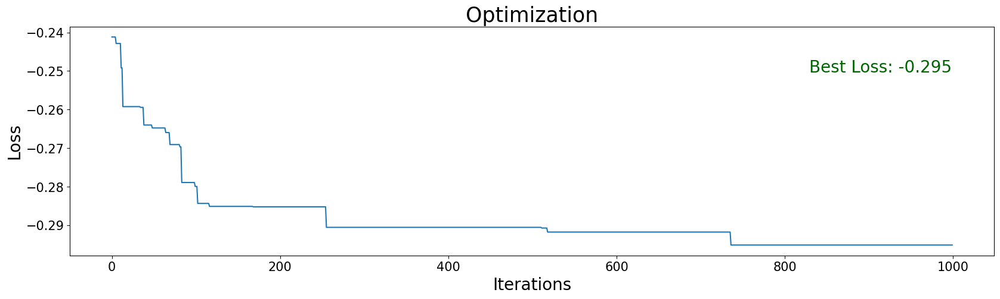

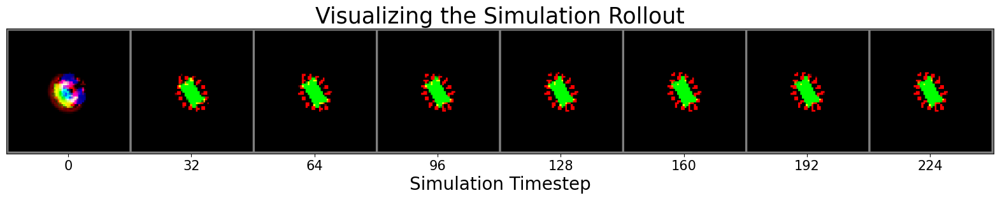

In [5]:
plt.figure(figsize=(20, 5))
plt.plot(data['best_loss'])
plt.xlabel("Iterations", fontsize=20); plt.ylabel("Loss", fontsize=20); plt.title("Optimization", fontsize=25)
plt.xticks(fontsize=15); plt.yticks(fontsize=15)
plt.text(0.8, 0.8, f"Best Loss: {best_loss:.3f}", color='darkgreen', fontsize=20, transform=plt.gca().transAxes)
plt.show()

plt.figure(figsize=(20, 6))
img = np.array(rollout_data['rgb'])
img = np.pad(img, ((0, 0), (2, 2), (2, 2), (0, 0)), constant_values=0.5)
img = rearrange(img, "T H W D -> H (T W) D")
img = np.pad(img, ((2, 2), (2, 2), (0, 0)), constant_values=0.5)
plt.imshow(img)
plt.xticks(np.arange(0, 8)*228+228//2, np.arange(0, 8)*substrate.rollout_steps//8, fontsize=15); plt.yticks([], fontsize=15)
plt.title("Visualizing the Simulation Rollout", fontsize=25)
plt.xlabel("Simulation Timestep", fontsize=20)
plt.show()

## Supervised Target (Temporal Targets)

Now, let's search for a Lenia simulation which produces a trajectory going from `"a small biological cell"` to `"a large biological cell"`.

Although not required (and not originally part of ASAL), it sometimes helps to include and tune the coef_softmax parameter below to incentivize the simulation to find unique images for each prompt rather than one static image satisfying both prompts.

Run this command:

In [6]:
! python main_opt.py --seed=4 --save_dir="./data/supervised_temporal_4" --substrate='lenia' --time_sampling=2 --prompts="a small biological cell;a large biological cell" --coef_prompt=1. --coef_softmax=0.1 --coef_oe=0. --bs=1 --pop_size=16 --n_iters=1000 --sigma=0.1

/home/kazuyahoribe/.pyenv/versions/3.10.13/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


Namespace(seed=4, save_dir='./data/supervised_temporal_4', substrate='lenia', rollout_steps=None, foundation_model='clip', time_sampling=2, prompts='a small biological cell;a large biological cell', coef_prompt=1.0, coef_softmax=0.1, coef_oe=0.0, bs=1, pop_size=16, n_iters=1000, sigma=0.1)
ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 3117 parameters detected for optimization.
100%|█████████████████████| 1000/1000 [07:56<00:00,  2.10it/s, best_loss=-0.241]


In [7]:
save_dir = "./data/supervised_temporal_4/"
data = util.load_pkl(save_dir, "data") # load optimization data
params, best_loss = util.load_pkl(save_dir, "best") # load the best parameters found

# fm = foundation_models.create_foundation_model('clip') # we don't need the foundation model for just the rollout currently
substrate = substrates.create_substrate('lenia') # create the substrate
substrate = substrates.FlattenSubstrateParameters(substrate) # useful wrapper to flatten the substrate parameters

rollout_fn = partial(rollout_simulation, s0=None, substrate=substrate, fm=None, rollout_steps=substrate.rollout_steps, time_sampling=8, img_size=224, return_state=False)
rollout_fn = jax.jit(rollout_fn)

rng = jax.random.PRNGKey(0)
rollout_data = rollout_fn(rng, params) # rollout the simulation using this rng seed and simulation parameters

ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 3117 parameters detected for optimization.


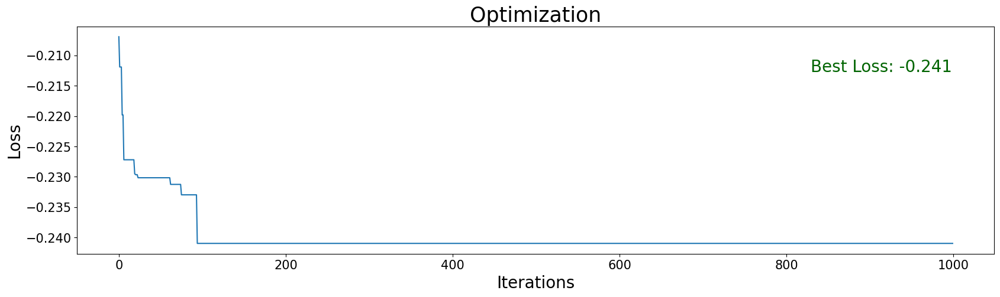

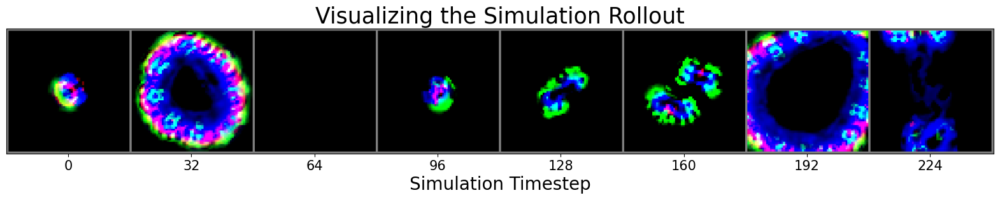

In [8]:
plt.figure(figsize=(20, 5))
plt.plot(data['best_loss'])
plt.xlabel("Iterations", fontsize=20); plt.ylabel("Loss", fontsize=20); plt.title("Optimization", fontsize=25)
plt.xticks(fontsize=15); plt.yticks(fontsize=15)
plt.text(0.8, 0.8, f"Best Loss: {best_loss:.3f}", color='darkgreen', fontsize=20, transform=plt.gca().transAxes)
plt.show()

plt.figure(figsize=(20, 6))
img = np.array(rollout_data['rgb'])
img = np.pad(img, ((0, 0), (2, 2), (2, 2), (0, 0)), constant_values=0.5)
img = rearrange(img, "T H W D -> H (T W) D")
img = np.pad(img, ((2, 2), (2, 2), (0, 0)), constant_values=0.5)
plt.imshow(img)
plt.xticks(np.arange(0, 8)*228+228//2, np.arange(0, 8)*substrate.rollout_steps//8, fontsize=15); plt.yticks([], fontsize=15)
plt.title("Visualizing the Simulation Rollout", fontsize=25)
plt.xlabel("Simulation Timestep", fontsize=20)
plt.show()

## Open-Endedness

Great! Now let's discover a Lenia simulation which is open-ended, meaning it generates novelty in time.

Run this command:

In [9]:
! python main_opt.py --seed=3 --save_dir="./data/open_endedness_3" --substrate='lenia' --time_sampling=32 --prompts="" --coef_prompt=0. --coef_softmax=0. --coef_oe=1. --bs=1 --pop_size=16 --n_iters=1000 --sigma=0.1

/home/kazuyahoribe/.pyenv/versions/3.10.13/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


Namespace(seed=3, save_dir='./data/open_endedness_3', substrate='lenia', rollout_steps=None, foundation_model='clip', time_sampling=32, prompts='', coef_prompt=0.0, coef_softmax=0.0, coef_oe=1.0, bs=1, pop_size=16, n_iters=1000, sigma=0.1)
ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 3117 parameters detected for optimization.
100%|██████████████████████| 1000/1000 [18:41<00:00,  1.12s/it, best_loss=0.894]


In [10]:
save_dir = "./data/open_endedness_3"
data = util.load_pkl(save_dir, "data") # load optimization data
params, best_loss = util.load_pkl(save_dir, "best") # load the best parameters found

# fm = foundation_models.create_foundation_model('clip') # we don't need the foundation model for just the rollout currently
substrate = substrates.create_substrate('lenia') # create the substrate
substrate = substrates.FlattenSubstrateParameters(substrate) # useful wrapper to flatten the substrate parameters

rollout_fn = partial(rollout_simulation, s0=None, substrate=substrate, fm=None, rollout_steps=substrate.rollout_steps, time_sampling=8, img_size=224, return_state=False)
rollout_fn = jax.jit(rollout_fn)

rng = jax.random.PRNGKey(0)
rollout_data = rollout_fn(rng, params) # rollout the simulation using this rng seed and simulation parameters

ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 3117 parameters detected for optimization.


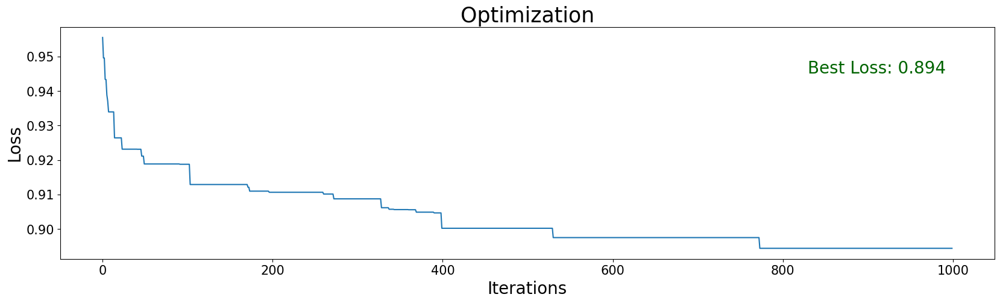

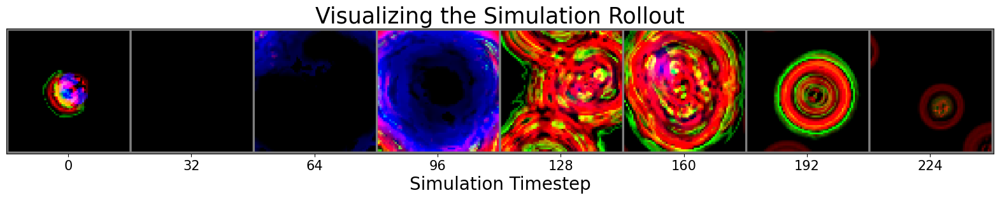

In [11]:
plt.figure(figsize=(20, 5))
plt.plot(data['best_loss'])
plt.xlabel("Iterations", fontsize=20); plt.ylabel("Loss", fontsize=20); plt.title("Optimization", fontsize=25)
plt.xticks(fontsize=15); plt.yticks(fontsize=15)
plt.text(0.8, 0.8, f"Best Loss: {best_loss:.3f}", color='darkgreen', fontsize=20, transform=plt.gca().transAxes)
plt.show()

plt.figure(figsize=(20, 6))
img = np.array(rollout_data['rgb'])
img = np.pad(img, ((0, 0), (2, 2), (2, 2), (0, 0)), constant_values=0.5)
img = rearrange(img, "T H W D -> H (T W) D")
img = np.pad(img, ((2, 2), (2, 2), (0, 0)), constant_values=0.5)
plt.imshow(img)
plt.xticks(np.arange(0, 8)*228+228//2, np.arange(0, 8)*substrate.rollout_steps//8, fontsize=15); plt.yticks([], fontsize=15)
plt.title("Visualizing the Simulation Rollout", fontsize=25)
plt.xlabel("Simulation Timestep", fontsize=20)
plt.show()

## Supervised Target + Open-Endedness

What if we combine the supervised target and open-endedness scores to optimize for?
Can we find an open-ended `"diverse ecosystem of cells"`?

Let's try it!

In [12]:
! python main_opt.py --seed=0 --save_dir="./data/st_oe_0" --substrate='lenia' --time_sampling=32 --prompts="a diverse ecosystem of cells" --coef_prompt=1. --coef_softmax=0. --coef_oe=1. --bs=1 --pop_size=16 --n_iters=1000 --sigma=0.1

/home/kazuyahoribe/.pyenv/versions/3.10.13/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


Namespace(seed=0, save_dir='./data/st_oe_0', substrate='lenia', rollout_steps=None, foundation_model='clip', time_sampling=32, prompts='a diverse ecosystem of cells', coef_prompt=1.0, coef_softmax=0.0, coef_oe=1.0, bs=1, pop_size=16, n_iters=1000, sigma=0.1)
ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 3117 parameters detected for optimization.
100%|██████████████████████| 1000/1000 [18:05<00:00,  1.09s/it, best_loss=0.653]


In [13]:
save_dir = "./data/st_oe_0"
data = util.load_pkl(save_dir, "data") # load optimization data
params, best_loss = util.load_pkl(save_dir, "best") # load the best parameters found

# fm = foundation_models.create_foundation_model('clip') # we don't need the foundation model for just the rollout currently
substrate = substrates.create_substrate('lenia') # create the substrate
substrate = substrates.FlattenSubstrateParameters(substrate) # useful wrapper to flatten the substrate parameters

rollout_fn = partial(rollout_simulation, s0=None, substrate=substrate, fm=None, rollout_steps=substrate.rollout_steps, time_sampling=8, img_size=224, return_state=False)
rollout_fn = jax.jit(rollout_fn)

rng = jax.random.PRNGKey(0)
rollout_data = rollout_fn(rng, params) # rollout the simulation using this rng seed and simulation parameters

ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 3117 parameters detected for optimization.


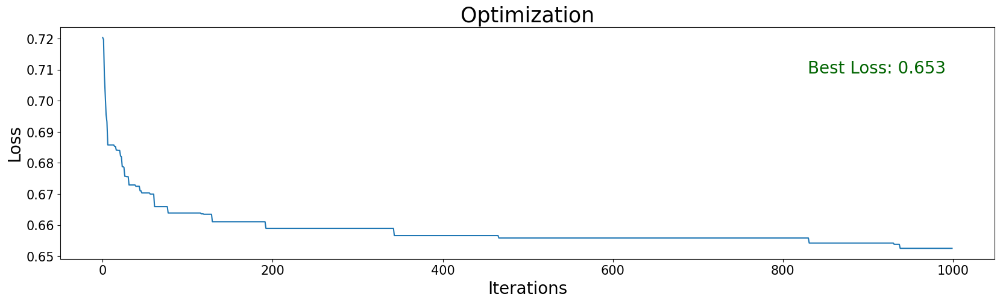

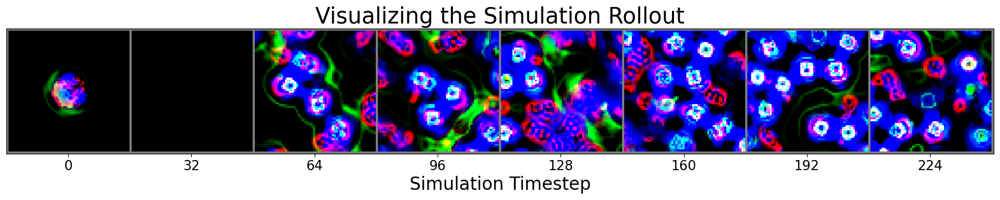

In [14]:
plt.figure(figsize=(20, 5))
plt.plot(data['best_loss'])
plt.xlabel("Iterations", fontsize=20); plt.ylabel("Loss", fontsize=20); plt.title("Optimization", fontsize=25)
plt.xticks(fontsize=15); plt.yticks(fontsize=15)
plt.text(0.8, 0.8, f"Best Loss: {best_loss:.3f}", color='darkgreen', fontsize=20, transform=plt.gca().transAxes)
plt.show()

plt.figure(figsize=(20, 6))
img = np.array(rollout_data['rgb'])
img = np.pad(img, ((0, 0), (2, 2), (2, 2), (0, 0)), constant_values=0.5)
img = rearrange(img, "T H W D -> H (T W) D")
img = np.pad(img, ((2, 2), (2, 2), (0, 0)), constant_values=0.5)
plt.imshow(img)
plt.xticks(np.arange(0, 8)*228+228//2, np.arange(0, 8)*substrate.rollout_steps//8, fontsize=15); plt.yticks([], fontsize=15)
plt.title("Visualizing the Simulation Rollout", fontsize=25)
plt.xlabel("Simulation Timestep", fontsize=20)
plt.show()

## Illumination

Great! Now let's try illuminating the entire Lenia substrate and find a diverse set of Lenia creatures!

Run this command in the terminal:

In [15]:
! python main_illuminate.py --seed=0 --save_dir="./data/illuminate_0" --substrate='lenia' --n_child=32 --pop_size=256 --n_iters=1000 --sigma=0.1

/home/kazuyahoribe/.pyenv/versions/3.10.13/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


Namespace(seed=0, save_dir='./data/illuminate_0', substrate='lenia', rollout_steps=None, foundation_model='clip', k_nbrs=2, n_child=32, pop_size=256, n_iters=1000, sigma=0.1)
ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 3117 parameters detected for optimization.
100%|███████████████████████████| 1000/1000 [14:27<00:00,  1.15it/s, loss=0.905]


In [16]:
save_dir = "./data/illuminate_0"
data = util.load_pkl(save_dir, "data") # load optimization data
pop = util.load_pkl(save_dir, "pop") # load the best parameters found
params = pop['params']

# fm = foundation_models.create_foundation_model('clip')
substrate = substrates.create_substrate('lenia')
substrate = substrates.FlattenSubstrateParameters(substrate)

rollout_fn = partial(rollout_simulation, s0=None, substrate=substrate, fm=None, rollout_steps=substrate.rollout_steps, time_sampling='final', img_size=224, return_state=False)
rollout_fn = jax.jit(rollout_fn)

rng = jax.random.PRNGKey(0)

rollout_data = [rollout_fn(rng, p) for p in params] # rollout the simulation using this rng seed and simulation parameters
rollout_data = jax.tree.map(lambda *x: jnp.stack(x, axis=0), *rollout_data) # stack the list of rollout data into a single tree
# note if you have enough GPU memory, you can just do vmap on rollout_fn!

ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 3117 parameters detected for optimization.


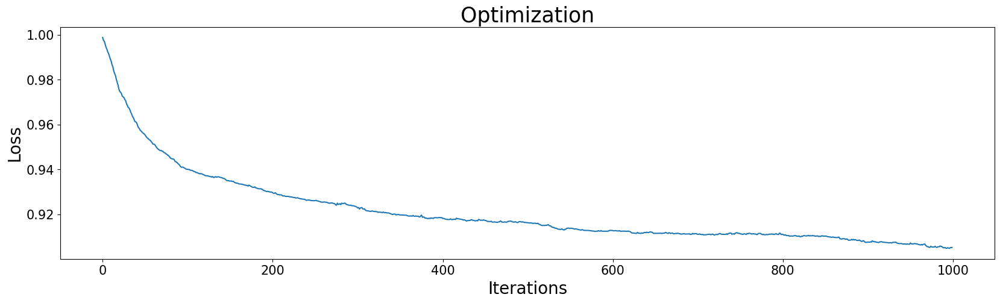

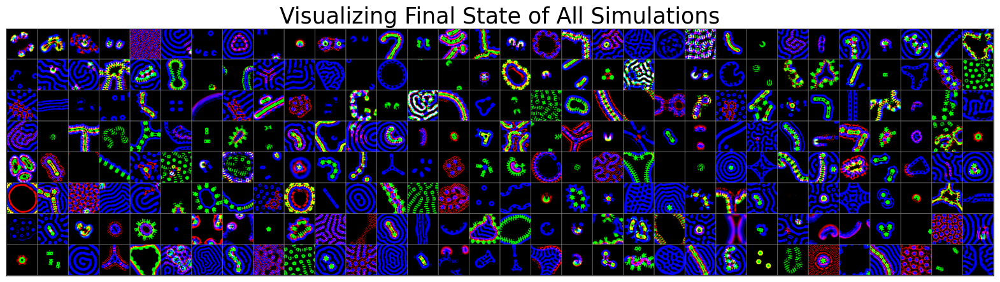

In [17]:
plt.figure(figsize=(20, 5))
plt.plot(data['loss'])
plt.xlabel("Iterations", fontsize=20); plt.ylabel("Loss", fontsize=20); plt.title("Optimization", fontsize=25)
plt.xticks(fontsize=15); plt.yticks(fontsize=15)
plt.show()

plt.figure(figsize=(20, 6))
img = np.array(rollout_data['rgb'])
img = np.pad(img, ((0, 0), (2, 2), (2, 2), (0, 0)), constant_values=0.5)
img = rearrange(img, "(R C) H W D -> (R H) (C W) D", R=8)
img = np.pad(img, ((2, 2), (2, 2), (0, 0)), constant_values=0.5)
plt.imshow(img)
plt.xticks([], fontsize=15); plt.yticks([], fontsize=15)
plt.title("Visualizing Final State of All Simulations", fontsize=25)
plt.show()

## Other substrates!

Above, we only showed results on Lenia because it runs the fastest, but feel free to run on other substrates as well!
We have implemented the following substrates already:
- [Lenia](https://en.wikipedia.org/wiki/Lenia)
- [Boids](https://en.wikipedia.org/wiki/Boids)
- [Particle Life](https://www.youtube.com/watch?v=scvuli-zcRc)
- Particle Life++ (Particle Life with changing color dynamics)
- [Particle Lenia](https://google-research.github.io/self-organising-systems/particle-lenia/)
- Discrete Neural Cellular Automata
- [Continuous Neural Cellular Automata](https://distill.pub/2020/growing-ca/)
- [Game of Life/Life-Like Cellular Automata](https://en.wikipedia.org/wiki/Life-like_cellular_automaton)

The following block visualizes random simulation parameters in each of these substrates.

Feel free to explore how you feel like now!
You can 
- find supervised target simulations in Boids
- or illuminate all Discrete NCA substrate
- or find open-ended Particle Life++ simulations
- or any combination you want!


Note that Game of Life will not work with the above scripts, because it is a discrete search space.
For sweeping Game of Life, check out the `main_sweep_gol.py` script.

Some tips on getting the results you want from a given substrate:
- Run for many seeds. Meta optimizing chaotic systems is quite tough and noisy. More seeds can significantly increase the chances of getting what you want.
- Play around with different hyperparameters.
    - When doing the supervised temporal targets with multiple prompts, `coef_softmax` needs to be tuned.
    - Pay attention to the `time_sampling` variable and tune it. For open-endedness, try setting `time_sampling` to a large value (32 works well).
- Run for more search iterations. This can get you quite far sometimes.
- Pick good expressive substrates. Some substrates aren't capable of expressing certain lifeforms. Check out the discussion section of the paper.
- Use better search algorithms! We used Sep-CMA-ES, SGD, GAs, and brute force search in the paper, but other search algorithms may be better for certain substrates you choose.
- CLIP seems to be a good choice of foundation model. I don't think this is the bottleneck. But newer foundation models may be better than CLIP.

Particle Life++ has lots of potential and is an extremely untapped substrate so far, so experimenting with that would be very cool, although optimization is hard in that, due to how chaotic it is.

If you get bored, it would be amazing to apply ASAL to newer substrates like [ALIEN](https://www.youtube.com/watch?v=qwbMGPkoJmg) and [JaxLife](https://github.com/luchris429/jaxlife)!

ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 3117 parameters detected for optimization.


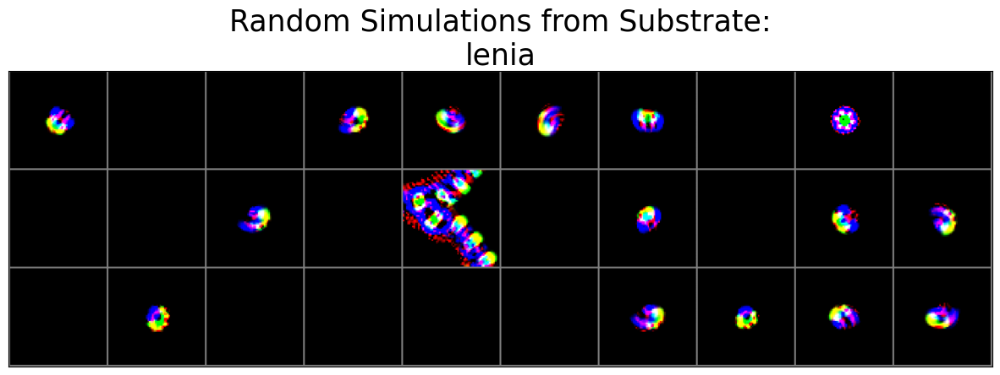

ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 193 parameters detected for optimization.


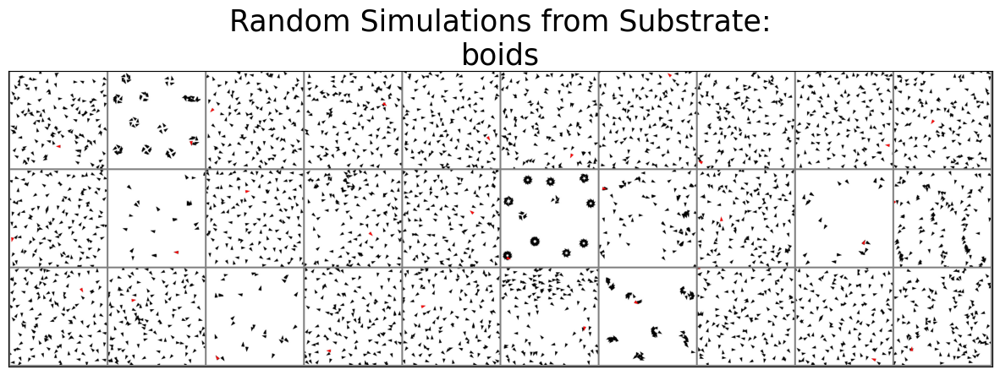

ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 42 parameters detected for optimization.


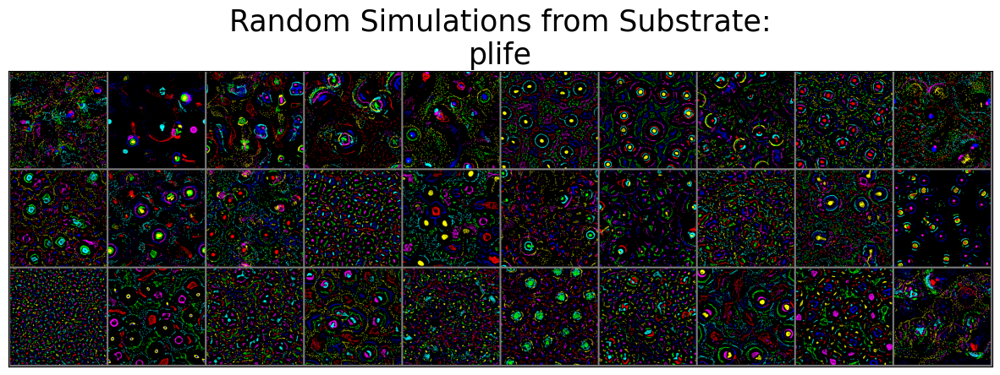

ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 311 parameters detected for optimization.


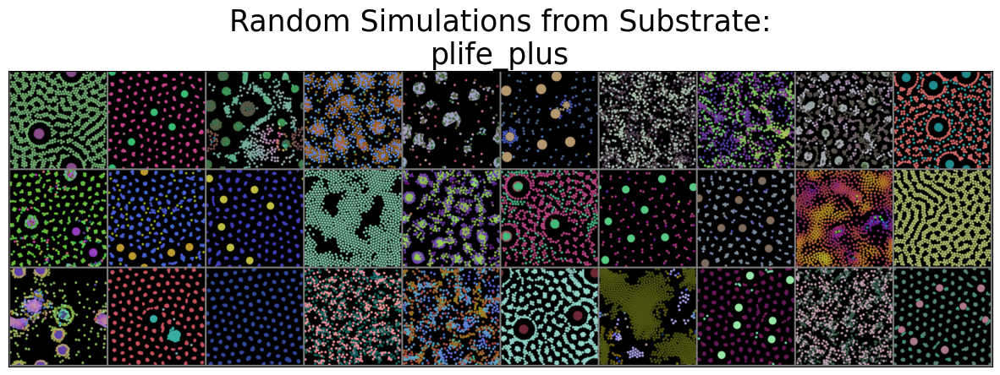

ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 6 parameters detected for optimization.


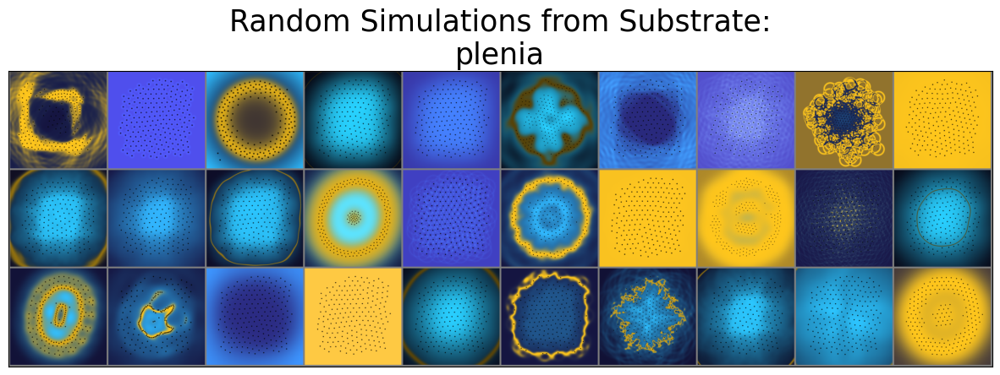

ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 588 parameters detected for optimization.


2025-04-10 16:51:04.088189: E external/xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-04-10 16:51:04.213213: E external/xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


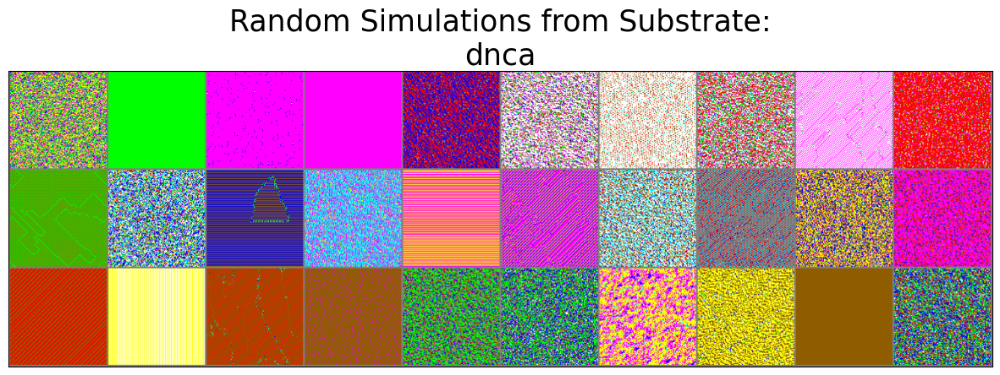

ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 209 parameters detected for optimization.


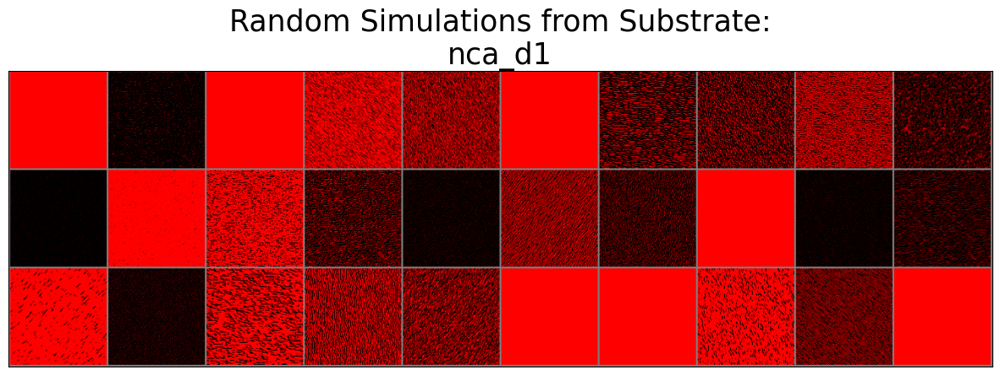

ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 315 parameters detected for optimization.


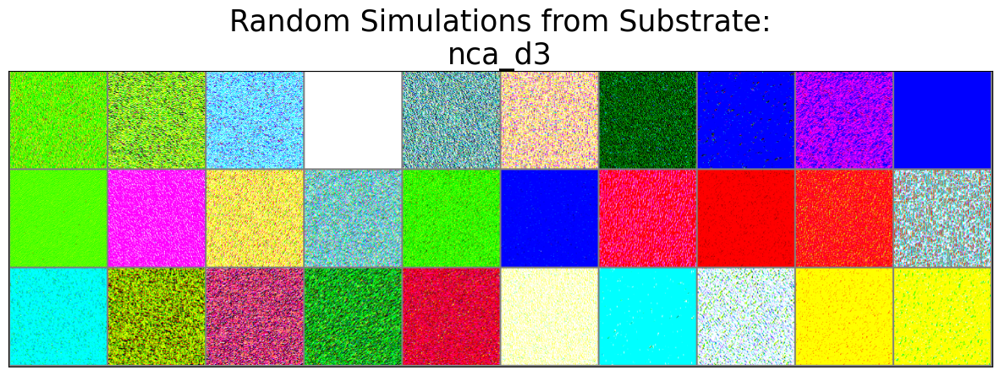

ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 1 parameters detected for optimization.


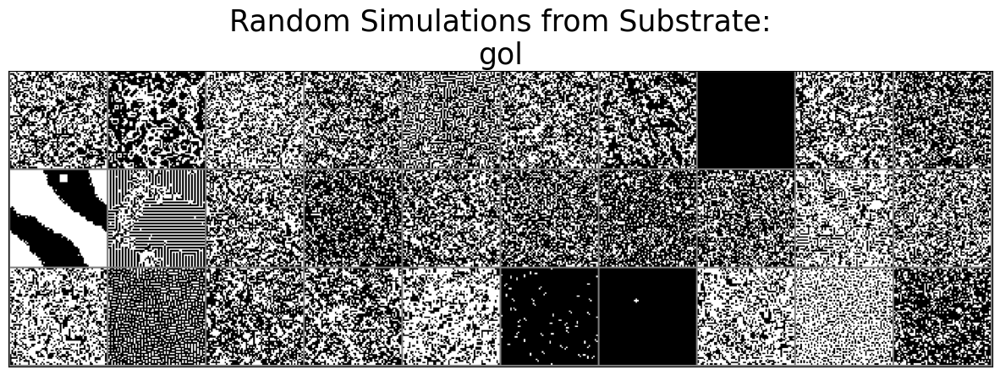

In [18]:
for substrate_name in ['lenia', 'boids', 'plife', 'plife_plus', 'plenia', 'dnca', 'nca_d1', 'nca_d3', 'gol']: # loop over substrates

    substrate = substrates.create_substrate(substrate_name)
    substrate = substrates.FlattenSubstrateParameters(substrate)

    rollout_fn = partial(rollout_simulation, s0=None, substrate=substrate, fm=None, rollout_steps=substrate.rollout_steps, time_sampling='final', img_size=224, return_state=False)
    rollout_fn = jax.jit(rollout_fn)

    rng = jax.random.PRNGKey(0)
    params = jax.vmap(substrate.default_params)(split(rng, 30)) # sample some random simulation parameters

    rollout_data = jax.vmap(rollout_fn, in_axes=(None, 0))(rng, params) # rollout the simulation using this rng seed and simulation parameters

    img = np.array(rollout_data['rgb'])
    img = np.pad(img, ((0, 0), (2, 2), (2, 2), (0, 0)), constant_values=0.5)
    img = rearrange(img, "(R C) H W D -> (R H) (C W) D", R=3)
    img = np.pad(img, ((2, 2), (2, 2), (0, 0)), constant_values=0.5)
    plt.figure(figsize=(15, 5))
    plt.imshow(img)
    plt.xticks([], fontsize=15); plt.yticks([], fontsize=15)
    plt.title(f"Random Simulations from Substrate:\n{substrate_name}", fontsize=25)
    plt.show()

## Loading in Previously Discovered Lifeforms

Here, we will show you how to load in previously discovered lifeforms we found in our large scale searches.

- The Lenia and Boids dataset contains 8192 simulations found in a large illumination search.
- The GoL dataset contains the 262144 simulations ranked in order of most open-ended to least open-ended.

To visualize these datasets, view:
- https://pub.sakana.ai/asal/data/illumination_poster_lenia.png
- https://pub.sakana.ai/asal/data/illumination_poster_boids.png

We will load and simulate Lenia simulation #6198, Boids simulation #4893, and the top 10 most open-ended GoL simulations.

First, let's download our dataset using these commands: 

In [19]:
# ------------------------DOWNLOAD DATASET FROM OUR SERVERS------------------------
! wget -P ./data https://pub.sakana.ai/asal/data/illumination_lenia.npz
! wget -P ./data https://pub.sakana.ai/asal/data/illumination_boids.npz
! wget -P ./data https://pub.sakana.ai/asal/data/illumination_plife.npz
! wget -P ./data https://pub.sakana.ai/asal/data/sweep_gol.npz

--2025-04-10 16:51:16--  https://pub.sakana.ai/asal/data/illumination_lenia.npz
Resolving pub.sakana.ai (pub.sakana.ai)... 34.49.208.105
Connecting to pub.sakana.ai (pub.sakana.ai)|34.49.208.105|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 102138122 (97M) [application/octet-stream]
Saving to: ‘./data/illumination_lenia.npz’

illumination_lenia. 100%[===================>]  97.41M  10.6MB/s    in 15s     

2025-04-10 16:51:30 (6.59 MB/s) - ‘./data/illumination_lenia.npz’ saved [102138122/102138122]

--2025-04-10 16:51:31--  https://pub.sakana.ai/asal/data/illumination_boids.npz
Resolving pub.sakana.ai (pub.sakana.ai)... 34.49.208.105
Connecting to pub.sakana.ai (pub.sakana.ai)|34.49.208.105|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6324490 (6.0M) [application/octet-stream]
Saving to: ‘./data/illumination_boids.npz’

illumination_boids. 100%[===================>]   6.03M  9.90MB/s    in 0.6s    

2025-04-10 16:51:31 (9.90 MB/s) 

(8192, 3117)
ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 3117 parameters detected for optimization.


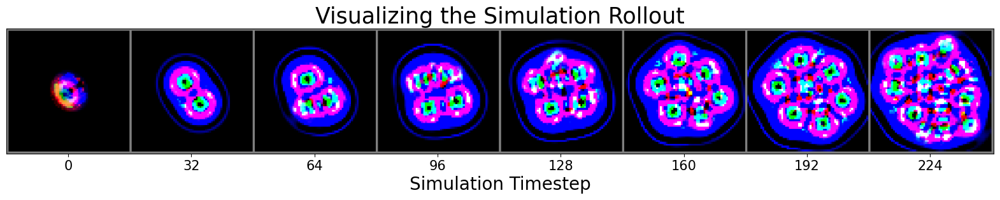

In [20]:
params_all = np.load("./data/illumination_lenia.npz", allow_pickle=True)['params']
print(params_all.shape) # shape: (number of simulations, parameter dimension)
params = params_all[6198] # let's visualize simulation #6198

substrate = substrates.create_substrate('lenia') # create the substrate
substrate = substrates.FlattenSubstrateParameters(substrate) # useful wrapper to flatten the substrate parameters

rollout_fn = partial(rollout_simulation, s0=None, substrate=substrate, fm=None, rollout_steps=substrate.rollout_steps, time_sampling=8, img_size=224, return_state=False)
rollout_fn = jax.jit(rollout_fn)

rng = jax.random.PRNGKey(0)
rollout_data = rollout_fn(rng, params) # rollout the simulation using this rng seed and simulation parameters

plt.figure(figsize=(20, 6))
img = np.array(rollout_data['rgb'])
img = np.pad(img, ((0, 0), (2, 2), (2, 2), (0, 0)), constant_values=0.5)
img = rearrange(img, "T H W D -> H (T W) D")
img = np.pad(img, ((2, 2), (2, 2), (0, 0)), constant_values=0.5)
plt.imshow(img)
plt.xticks(np.arange(0, 8)*228+228//2, np.arange(0, 8)*substrate.rollout_steps//8, fontsize=15); plt.yticks([], fontsize=15)
plt.title("Visualizing the Simulation Rollout", fontsize=25)
plt.xlabel("Simulation Timestep", fontsize=20)
plt.show()

(8192, 193)
ParameterReshaper: 2 devices detected. Please make sure that the ES population size divides evenly across the number of devices to pmap/parallelize over.
ParameterReshaper: 193 parameters detected for optimization.


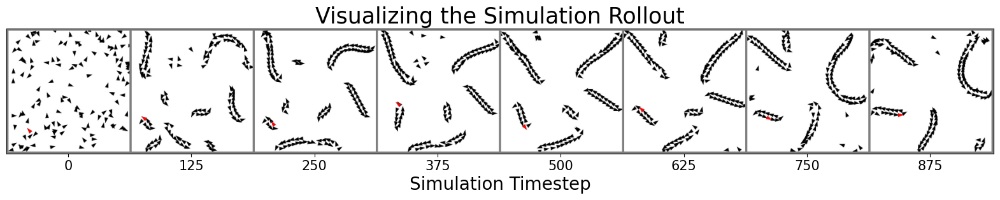

In [21]:
params_all = np.load("./data/illumination_boids.npz", allow_pickle=True)['params']
print(params_all.shape) # shape: (number of simulations, parameter dimension)
params = params_all[4893] # let's visualize simulation #4893

substrate = substrates.create_substrate('boids') # create the substrate
substrate = substrates.FlattenSubstrateParameters(substrate) # useful wrapper to flatten the substrate parameters

rollout_fn = partial(rollout_simulation, s0=None, substrate=substrate, fm=None, rollout_steps=substrate.rollout_steps, time_sampling=8, img_size=224, return_state=False)
rollout_fn = jax.jit(rollout_fn)

rng = jax.random.PRNGKey(0)
rollout_data = rollout_fn(rng, params) # rollout the simulation using this rng seed and simulation parameters

plt.figure(figsize=(20, 6))
img = np.array(rollout_data['rgb'])
img = np.pad(img, ((0, 0), (2, 2), (2, 2), (0, 0)), constant_values=0.5)
img = rearrange(img, "T H W D -> H (T W) D")
img = np.pad(img, ((2, 2), (2, 2), (0, 0)), constant_values=0.5)
plt.imshow(img)
plt.xticks(np.arange(0, 8)*228+228//2, np.arange(0, 8)*substrate.rollout_steps//8, fontsize=15); plt.yticks([], fontsize=15)
plt.title("Visualizing the Simulation Rollout", fontsize=25)
plt.xlabel("Simulation Timestep", fontsize=20)
plt.show()

(262144,)


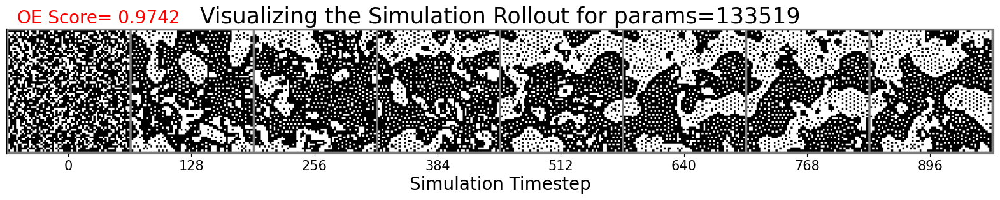

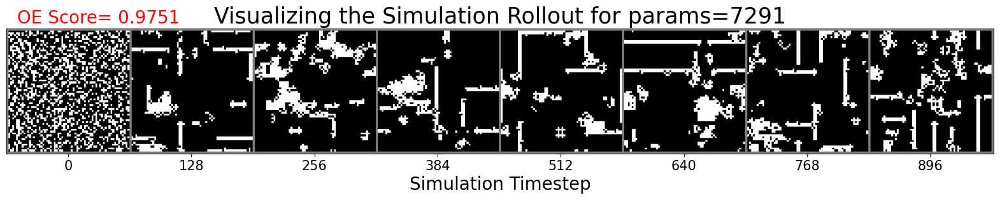

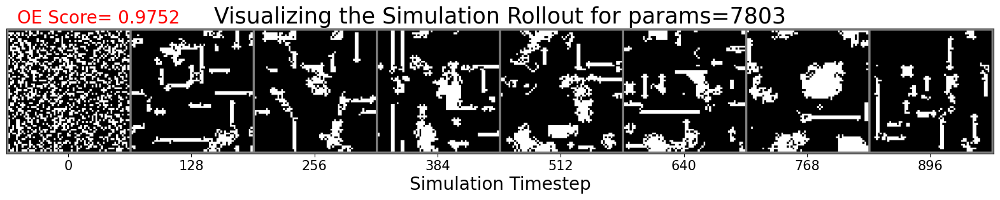

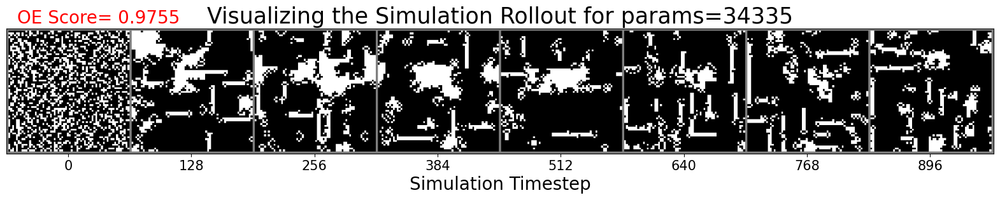

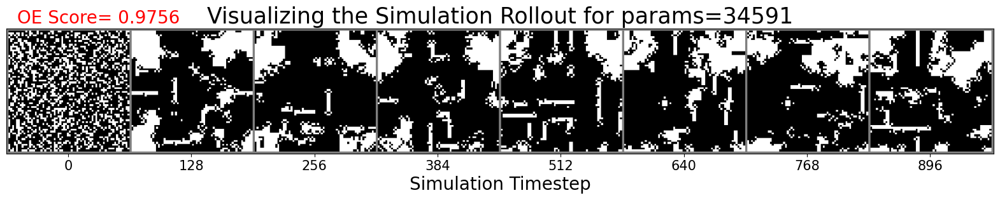

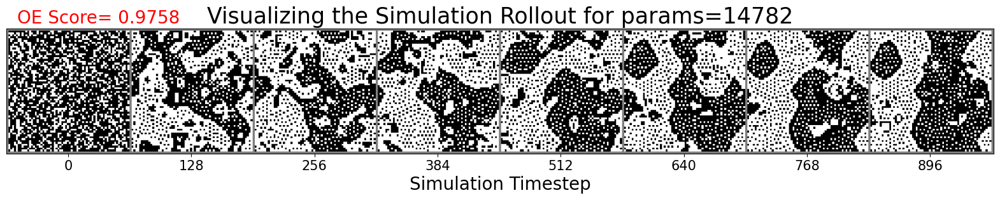

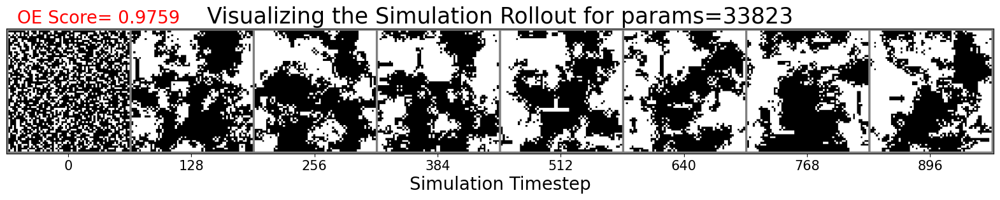

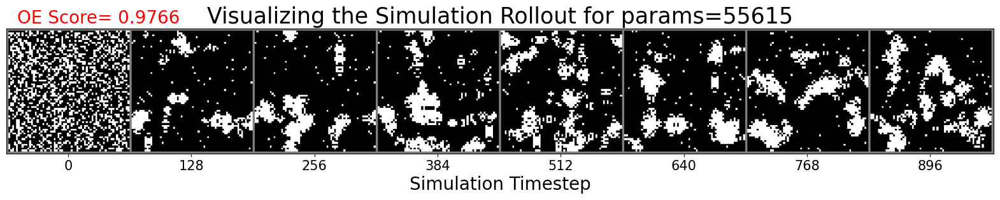

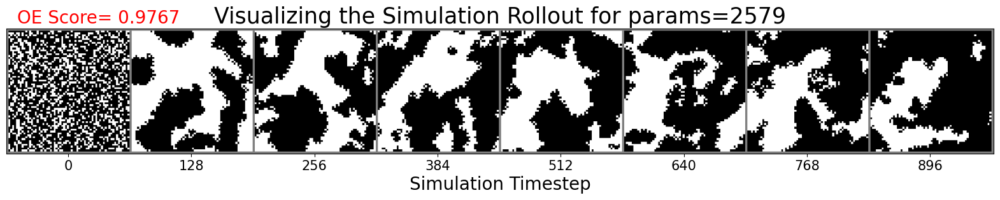

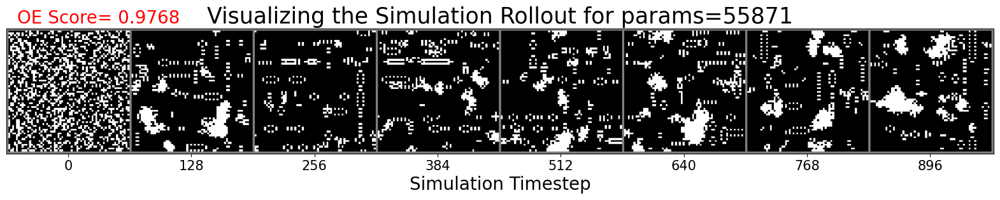

In [22]:
gol_data = np.load("./data/sweep_gol.npz", allow_pickle=True)
params_all = gol_data['params']
oe_score_all = gol_data['oe_score']
print(params_all.shape) # shape: (number of simulations, )

for i in range(10):
    params, oe_score = params_all[i], oe_score_all[i] # let's visualize simulation #{i}

    substrate = substrates.create_substrate('gol') # create the substrate
    # substrate = substrates.FlattenSubstrateParameters(substrate) # useful wrapper to flatten the substrate parameters

    rollout_fn = partial(rollout_simulation, s0=None, substrate=substrate, fm=None, rollout_steps=substrate.rollout_steps, time_sampling=8, img_size=224, return_state=False)
    rollout_fn = jax.jit(rollout_fn)

    rng = jax.random.PRNGKey(0)
    rollout_data = rollout_fn(rng, params) # rollout the simulation using this rng seed and simulation parameters

    plt.figure(figsize=(20, 6))
    img = np.array(rollout_data['rgb'])
    img = np.pad(img, ((0, 0), (2, 2), (2, 2), (0, 0)), constant_values=0.5)
    img = rearrange(img, "T H W D -> H (T W) D")
    img = np.pad(img, ((2, 2), (2, 2), (0, 0)), constant_values=0.5)
    plt.imshow(img)
    plt.xticks(np.arange(0, 8)*228+228//2, np.arange(0, 8)*substrate.rollout_steps//8, fontsize=15); plt.yticks([], fontsize=15)
    plt.title(f"Visualizing the Simulation Rollout for params={params.item()}", fontsize=25)
    plt.xlabel("Simulation Timestep", fontsize=20)
    plt.text(20, -10, f"OE Score= {oe_score:.4f}", fontsize=20, color='red')
    plt.show()